In [1]:
import torch

print(f"PyTorch version: {torch.__version__}")

PyTorch version: 2.6.0+cu118


In [81]:
from transformers import AutoModelForSequenceClassification, AutoTokenizer

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

tokenizer = AutoTokenizer.from_pretrained('google/electra-small-discriminator')
model = AutoModelForSequenceClassification.from_pretrained('google/electra-small-discriminator', num_labels=3)
model = model.to(device)


Some weights of ElectraForSequenceClassification were not initialized from the model checkpoint at google/electra-small-discriminator and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
import chardet

# Detect encoding of the file
with open("D:/sentimentdataset/train.csv", "rb") as f:
    result = chardet.detect(f.read())
    print(result)  # This will show the detected encoding

In [6]:
import chardet

# Detect encoding for train.csv
with open("D:/sentimentdataset/train.csv", "rb") as f:
    train_encoding = chardet.detect(f.read())['encoding']

# Detect encoding for df_t.csv
with open("D:/df_t.csv", "rb") as f:
    df_t_encoding = chardet.detect(f.read())['encoding']

with open('D:/twitter_df/twitter_training.csv', "rb") as f:
    train_twitter_encoding = chardet.detect(f.read())['encoding']

with open('D:/twitter_df/twitter_validation.csv', "rb") as f:
    test_twitter_encoding = chardet.detect(f.read())['encoding']

with open('D:/IMDB_df/IMDB Dataset.csv', "rb") as f:
    imdb_encoding = chardet.detect(f.read())['encoding']



In [7]:
print(train_encoding)
print(df_t_encoding)
print(train_twitter_encoding)
print(test_twitter_encoding)
print(imdb_encoding)

Windows-1252
MacRoman
MacRoman
MacRoman
utf-8


In [5]:
import pandas as pd

In [6]:
from sklearn.metrics import classification_report

In [89]:
print(model)

ElectraForSequenceClassification(
  (electra): ElectraModel(
    (embeddings): ElectraEmbeddings(
      (word_embeddings): Embedding(30522, 128, padding_idx=0)
      (position_embeddings): Embedding(512, 128)
      (token_type_embeddings): Embedding(2, 128)
      (LayerNorm): LayerNorm((128,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (embeddings_project): Linear(in_features=128, out_features=256, bias=True)
    (encoder): ElectraEncoder(
      (layer): ModuleList(
        (0-11): 12 x ElectraLayer(
          (attention): ElectraAttention(
            (self): ElectraSelfAttention(
              (query): Linear(in_features=256, out_features=256, bias=True)
              (key): Linear(in_features=256, out_features=256, bias=True)
              (value): Linear(in_features=256, out_features=256, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): ElectraSelfOutput(
              (dense): Li

In [90]:
for name, param in model.named_parameters():
    print(name)


electra.embeddings.word_embeddings.weight
electra.embeddings.position_embeddings.weight
electra.embeddings.token_type_embeddings.weight
electra.embeddings.LayerNorm.weight
electra.embeddings.LayerNorm.bias
electra.embeddings_project.weight
electra.embeddings_project.bias
electra.encoder.layer.0.attention.self.query.weight
electra.encoder.layer.0.attention.self.query.bias
electra.encoder.layer.0.attention.self.key.weight
electra.encoder.layer.0.attention.self.key.bias
electra.encoder.layer.0.attention.self.value.weight
electra.encoder.layer.0.attention.self.value.bias
electra.encoder.layer.0.attention.output.dense.weight
electra.encoder.layer.0.attention.output.dense.bias
electra.encoder.layer.0.attention.output.LayerNorm.weight
electra.encoder.layer.0.attention.output.LayerNorm.bias
electra.encoder.layer.0.intermediate.dense.weight
electra.encoder.layer.0.intermediate.dense.bias
electra.encoder.layer.0.output.dense.weight
electra.encoder.layer.0.output.dense.bias
electra.encoder.layer.

In [9]:
import pandas as pd

In [ ]:
with open('D:/twitter_df/twitter_training.csv', "rb") as f:
    train_twitter_encoding = chardet.detect(f.read())['encoding']

with open('D:/twitter_df/twitter_validation.csv', "rb") as f:
    test_twitter_encoding = chardet.detect(f.read())['encoding']

with open('D:/IMDB_df/IMDB Dataset.csv', "rb") as f:
    imdb_encoding = chardet.detect(f.read())['encoding']

In [10]:
twitter_train_df = pd.read_csv("D:/twitter_df/twitter_training.csv", encoding=train_twitter_encoding)
twitter_test_df = pd.read_csv("D:/twitter_df/twitter_validation.csv", encoding=test_twitter_encoding)

imdb_df = pd.read_csv("D:/IMDB_df/IMDB Dataset.csv", encoding=imdb_encoding)

In [ ]:
twitter_df.rename(columns={'clean_text': 'text', 'category' : 'sentiment'}, inplace=True)

In [13]:
twitter_train_df

,2401,Borderlands,Positive,"im getting on borderlands and i will murder you all ,"
0,2401,Borderlands,Positive,I am coming to the borders and I will kill you...
1,2401,Borderlands,Positive,im getting on borderlands and i will kill you ...
2,2401,Borderlands,Positive,im coming on borderlands and i will murder you...
3,2401,Borderlands,Positive,im getting on borderlands 2 and i will murder ...
4,2401,Borderlands,Positive,im getting into borderlands and i can murder y...
...,...,...,...,...
74676,9200,Nvidia,Positive,Just realized that the Windows partition of my...
74677,9200,Nvidia,Positive,Just realized that my Mac window partition is ...
74678,9200,Nvidia,Positive,Just realized the windows partition of my Mac ...
74679,9200,Nvidia,Positive,Just realized between the windows partition of...


In [12]:
twitter_train_df.columns

Index(['2401', 'Borderlands', 'Positive',
       'im getting on borderlands and i will murder you all ,'],
      dtype='object')

In [14]:
twitter_test_df

,3364,Facebook,Irrelevant,"I mentioned on Facebook that I was struggling for motivation to go for a run the other day, which has been translated by Tom‚Äôs great auntie as ‚ÄòHayley can‚Äôt get out of bed‚Äô and told to his grandma, who now thinks I‚Äôm a lazy, terrible person ü§£"
0,352,Amazon,Neutral,BBC News - Amazon boss Jeff Bezos rejects clai...
1,8312,Microsoft,Negative,@Microsoft Why do I pay for WORD when it funct...
2,4371,CS-GO,Negative,"CSGO matchmaking is so full of closet hacking,..."
3,4433,Google,Neutral,Now the President is slapping Americans in the...
4,6273,FIFA,Negative,Hi @EAHelp I‚Äôve had Madeleine McCann in my c...
...,...,...,...,...
994,4891,GrandTheftAuto(GTA),Irrelevant,‚≠êÔ∏è Toronto is the arts and culture capital...
995,4359,CS-GO,Irrelevant,tHIS IS ACTUALLY A GOOD MOVE TOT BRING MORE VI...
996,2652,Borderlands,Positive,Today sucked so it‚Äôs time to drink wine n pl...
997,8069,Microsoft,Positive,Bought a fraction of Microsoft today. Small wins.


In [26]:
imdb_df

,text,sentiment
0,One of the other reviewers has mentioned that ...,2
1,A wonderful little production. <br /><br />The...,2
2,I thought this was a wonderful way to spend ti...,2
3,Basically there's a family where a little boy ...,0
4,"Petter Mattei's ""Love in the Time of Money"" is...",2
...,...,...
49995,I thought this movie did a down right good job...,2
49996,"Bad plot, bad dialogue, bad acting, idiotic di...",0
49997,I am a Catholic taught in parochial elementary...,0
49998,I'm going to have to disagree with the previou...,0


In [23]:
imdb_df.rename(columns={'review': 'text'}, inplace=True)


In [20]:
imdb_df.duplicated().sum()

np.int64(0)

In [19]:
imdb_df.drop_duplicates(inplace=True)

In [25]:
# Define the correct label mapping
imdb_label_mapping = {
    "negative": 0,
    "positive": 2
}
imdb_df['sentiment'] = imdb_df['sentiment'].map(imdb_label_mapping)


In [27]:
from sklearn.model_selection import train_test_split

# Perform the train-test split
train_imdb_df, test_imdb_df = train_test_split(imdb_df, test_size=0.2, random_state=42, stratify=imdb_df['sentiment'])

# Display the shapes of the resulting datasets
print(f"Train set shape: {train_imdb_df.shape}")
print(f"Test set shape: {test_imdb_df.shape}")

Train set shape: (39665, 2)
Test set shape: (9917, 2)


In [30]:
twitter_train_df

,Positive,"im getting on borderlands and i will murder you all ,"
0,Positive,I am coming to the borders and I will kill you...
1,Positive,im getting on borderlands and i will kill you ...
2,Positive,im coming on borderlands and i will murder you...
3,Positive,im getting on borderlands 2 and i will murder ...
4,Positive,im getting into borderlands and i can murder y...
...,...,...
74676,Positive,Just realized that the Windows partition of my...
74677,Positive,Just realized that my Mac window partition is ...
74678,Positive,Just realized the windows partition of my Mac ...
74679,Positive,Just realized between the windows partition of...


In [29]:
twitter_train_df.drop(columns= ['2401', 'Borderlands'], inplace = True)
twitter_test_df.drop(columns = ['3364', 'Facebook'], inplace = True)

In [33]:
twitter_train_df.rename(columns={'im getting on borderlands and i will murder you all ,' : 'text', 'Positive': 'sentiment'}, inplace=True)
twitter_test_df.rename(columns={'I mentioned on Facebook that I was struggling for motivation to go for a run the other day, which has been translated by Tom‚Äôs great auntie as ‚ÄòHayley can‚Äôt get out of bed‚Äô and told to his grandma, who now thinks I‚Äôm a lazy, terrible person ü§£': 'text', 'Irrelevant' : 'sentiment'}, inplace=True)



In [37]:
twitter_train_df = twitter_train_df[['text', 'sentiment']]

In [39]:
twitter_test_df = twitter_test_df[['text', 'sentiment']]

In [41]:
# Define the correct label mapping
twitter_label_mapping = {
    "Neutral": 1
}
twitter_train_df['sentiment'] = twitter_train_df['sentiment'].map(twitter_label_mapping)
twitter_test_df['sentiment'] = twitter_test_df['sentiment'].map(twitter_label_mapping)


In [44]:
twitter_train_df = twitter_train_df.dropna(subset=['sentiment'])
twitter_test_df = twitter_test_df.dropna(subset=['sentiment'])

In [45]:
twitter_train_df['sentiment'] = twitter_train_df['sentiment'].astype(int)
twitter_test_df['sentiment'] = twitter_test_df['sentiment'].astype(int)

C:\Users\Dylan James Dejoras\AppData\Local\Temp\ipykernel_24300\2296601363.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  twitter_train_df['sentiment'] = twitter_train_df['sentiment'].astype(int)
C:\Users\Dylan James Dejoras\AppData\Local\Temp\ipykernel_24300\2296601363.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  twitter_test_df['sentiment'] = twitter_test_df['sentiment'].astype(int)


In [46]:
twitter_test_df

,text,sentiment
0,BBC News - Amazon boss Jeff Bezos rejects clai...,1
3,Now the President is slapping Americans in the...,1
12,CSGO WIngman (Im Silver dont bully) twitch.tv/...,1
20,Anyone that plays a bad luck albatross deck in...,1
23,Umm @PlayApex when I died it said Bug This pi...,1
...,...,...
976,This is....odd. @Google suggests the most dead...,1
984,@6th__man playing red dead redemption-\n\n‚ÄúO...,1
987,‚ô•Ô∏è Suikoden 2\n1Ô∏è‚É£ Alex Kidd in Miracl...,1
990,Late night stream with the boys! Come watch so...,1


In [49]:
twitter_train_df.drop_duplicates(inplace=True) 
twitter_test_df.drop_duplicates(inplace=True)

C:\Users\Dylan James Dejoras\AppData\Local\Temp\ipykernel_24300\3570706386.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  twitter_train_df.drop_duplicates(inplace=True)
C:\Users\Dylan James Dejoras\AppData\Local\Temp\ipykernel_24300\3570706386.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  twitter_test_df.drop_duplicates(inplace=True)


In [ ]:
twitter_train_df.duplicated().sum()

np.int64(0)

In [ ]:
twitter_test_df.duplicated().sum() 

In [54]:
twitter_train_df

,text,sentiment
11,"Rock-Hard La Varlope, RARE & POWERFUL, HANDSOM...",1
12,"Rock-Hard La Varlope, RARE & POWERFUL, HANDSOM...",1
13,"Rock-Hard La Varlope, RARE & POWERFUL, HANDSOM...",1
14,"Rock-Hard La Vita, RARE BUT POWERFUL, HANDSOME...",1
15,"Live Rock - Hard music La la Varlope, RARE & t...",1
...,...,...
74658,"Nvidia plans to release its 2017 ""Crypto Craze...",1
74659,"Nvidia does not want to give up its ""cryptoins...",1
74660,Nvidia doesn‚Äôt intend to give away its 2017 ...,1
74661,Nvidia therefore doesn ‚Äô t want to give up i...,1


In [55]:
twitter_test_df

,text,sentiment
0,BBC News - Amazon boss Jeff Bezos rejects clai...,1
3,Now the President is slapping Americans in the...,1
12,CSGO WIngman (Im Silver dont bully) twitch.tv/...,1
20,Anyone that plays a bad luck albatross deck in...,1
23,Umm @PlayApex when I died it said Bug This pi...,1
...,...,...
976,This is....odd. @Google suggests the most dead...,1
984,@6th__man playing red dead redemption-\n\n‚ÄúO...,1
987,‚ô•Ô∏è Suikoden 2\n1Ô∏è‚É£ Alex Kidd in Miracl...,1
990,Late night stream with the boys! Come watch so...,1


In [58]:
train_df = pd.read_csv("D:/sentimentdataset/train.csv", encoding='Windows-1252')
test_df = pd.read_csv("D:/sentimentdataset/test.csv", encoding='Windows-1252')

-------

In [59]:
# Define the correct label mapping
label_mapping = {
    "negative": 0,
    "neutral": 1,
    "positive": 2
}
train_df['sentiment'] = train_df['sentiment'].map(label_mapping)
test_df['sentiment'] = test_df['sentiment'].map(label_mapping)

# Drop rows with NaN values (if any)
train_df = train_df.dropna(subset=['text'])
test_df = test_df.dropna(subset=['text'])

In [60]:
print(train_df['sentiment'].value_counts())

sentiment
1    11117
2     8582
0     7781
Name: count, dtype: int64


In [61]:
train_df.columns

Index(['textID', 'text', 'selected_text', 'sentiment', 'Time of Tweet',
       'Age of User', 'Country', 'Population -2020', 'Land Area (Km²)',
       'Density (P/Km²)'],
      dtype='object')

In [62]:
train_df.drop(columns = ['textID', 'selected_text', 'Time of Tweet', 'Age of User', 
                         'Country', 'Population -2020', 'Land Area (Km²)', 'Density (P/Km²)'], inplace = True)

In [63]:
test_df.drop(columns = ['textID', 'Time of Tweet', 'Age of User', 
                         'Country', 'Population -2020', 'Land Area (Km²)', 'Density (P/Km²)'], inplace = True)

In [64]:
df_t = pd.read_csv('D:/df_t.csv')

In [65]:
merged_df = pd.read_csv('D:/merged_df.csv')

In [66]:
df_t.rename(columns = {'label': 'sentiment'}, inplace = True)
merged_df.rename(columns = {'label': 'sentiment'}, inplace = True)

In [67]:
train_df = pd.concat([train_df, df_t], ignore_index=False)
test_df = pd.concat([test_df, merged_df], ignore_index=False)

In [68]:
train_df.value_counts

<bound method DataFrame.value_counts of                                                     text  sentiment
0                    I`d have responded, if I were going          1
1          Sooo SAD I will miss you here in San Diego!!!          0
2                              my boss is bullying me...          0
3                         what interview! leave me alone          0
4       Sons of ****, why couldn`t they put them on t...          0
...                                                  ...        ...
31227   Grrrr....I got the wrong size coat for the sheep          0
31228                              4 cases of swine flu!          1
31229                                          excellent          2
31230  is sitting thru the boring bits in Titanic wai...          1
31231                                    Missed the play          0

[58712 rows x 2 columns]>

In [69]:
train_df

,text,sentiment
0,"I`d have responded, if I were going",1
1,Sooo SAD I will miss you here in San Diego!!!,0
2,my boss is bullying me...,0
3,what interview! leave me alone,0
4,"Sons of ****, why couldn`t they put them on t...",0
...,...,...
31227,Grrrr....I got the wrong size coat for the sheep,0
31228,4 cases of swine flu!,1
31229,excellent,2
31230,is sitting thru the boring bits in Titanic wai...,1


In [70]:
test_df['sentiment'] = test_df['sentiment'].astype(int)

In [71]:
test_df

,text,sentiment
0,Last session of the day http://twitpic.com/67ezh,1
1,Shanghai is also really exciting (precisely -...,2
2,"Recession hit Veronique Branquinho, she has to...",0
3,happy bday!,2
4,http://twitpic.com/4w75p - I like it!!,2
...,...,...
10406,Not sure what happened but now I have to hit t...,1
10407,"Pretty good app, lets you organize tasks by ca...",2
10408,This app is a piece of sh**. It won't sync my ...,0
10409,": Very interested. However, low carbs for the ...",2


In [72]:
test_df.value_counts

<bound method DataFrame.value_counts of                                                     text  sentiment
0      Last session of the day  http://twitpic.com/67ezh          1
1       Shanghai is also really exciting (precisely -...          2
2      Recession hit Veronique Branquinho, she has to...          0
3                                            happy bday!          2
4                 http://twitpic.com/4w75p - I like it!!          2
...                                                  ...        ...
10406  Not sure what happened but now I have to hit t...          1
10407  Pretty good app, lets you organize tasks by ca...          2
10408  This app is a piece of sh**. It won't sync my ...          0
10409  : Very interested. However, low carbs for the ...          2
10410  Good app, but not exactly what I was looking f...          2

[13945 rows x 2 columns]>

In [73]:
df_t

,text,sentiment
0,"Cooking microwave pizzas, yummy",2
1,Any plans of allowing sub tasks to show up in ...,1
2,"I love the humor, I just reworded it. Like sa...",2
3,naw idk what ur talkin about,1
4,That sucks to hear. I hate days like that,0
...,...,...
31227,Grrrr....I got the wrong size coat for the sheep,0
31228,4 cases of swine flu!,1
31229,excellent,2
31230,is sitting thru the boring bits in Titanic wai...,1


In [26]:
train_df

,text,sentiment
0,"I`d have responded, if I were going",1
1,Sooo SAD I will miss you here in San Diego!!!,0
2,my boss is bullying me...,0
3,what interview! leave me alone,0
4,"Sons of ****, why couldn`t they put them on t...",0
...,...,...
31227,Grrrr....I got the wrong size coat for the sheep,0
31228,4 cases of swine flu!,1
31229,excellent,2
31230,is sitting thru the boring bits in Titanic wai...,1


In [76]:
test_df.isna().sum()

text         0
sentiment    0
dtype: int64

In [75]:
train_df = train_df.dropna(subset=['text'])
test_df = test_df.dropna(subset=['text'])

In [77]:
train_df = pd.concat([train_df, twitter_train_df], ignore_index=True)
test_df = pd.concat([test_df, twitter_test_df], ignore_index=True)

In [78]:
train_df = pd.concat([train_df, train_imdb_df], ignore_index=True)
test_df = pd.concat([test_df, test_imdb_df], ignore_index=True)

In [79]:
train_df 

,text,sentiment
0,"I`d have responded, if I were going",1
1,Sooo SAD I will miss you here in San Diego!!!,0
2,my boss is bullying me...,0
3,what interview! leave me alone,0
4,"Sons of ****, why couldn`t they put them on t...",0
...,...,...
115483,As a big Jim Carey fan I took my seat in the c...,0
115484,"Kevin Spacey again picks a winner with K-PAX, ...",2
115485,I remember watching this in the 1970s - then I...,2
115486,at the story. It is reality mixed with America...,2


In [80]:
test_df

,text,sentiment
0,Last session of the day http://twitpic.com/67ezh,1
1,Shanghai is also really exciting (precisely -...,2
2,"Recession hit Veronique Branquinho, she has to...",0
3,happy bday!,2
4,http://twitpic.com/4w75p - I like it!!,2
...,...,...
24141,"I say 'I'd figure' in that line because, frank...",0
24142,This is arguably the worst film I have ever se...,0
24143,CONTAINS SPOILERS!<br /><br />I saw an advert ...,2
24144,"This movie, supposedly a thriller, had about f...",0


In [85]:
train_df.dropna(subset=['text'], inplace=True)

In [86]:
train_df.isna().sum()

text         0
sentiment    0
dtype: int64

------

In [88]:
# Import necessary libraries
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score
from bert_score import score as bert_score  # optional, for semantic similarity
from torch.utils.data import DataLoader, Dataset
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from sklearn.model_selection import train_test_split
import pandas as pd
from sklearn.metrics import cohen_kappa_score, matthews_corrcoef

# Define device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('Using', device)

# Load your dataset (replace this with your actual data loading logic)
# Example: If you have a CSV file for train and test
#train_df = pd.read_csv("D:/sentimentdataset/train.csv", encoding=result['encoding'])
# test_df = pd.read_csv("D:/sentimentdataset/test.csv", encoding=result['encoding'])

# Define a custom Dataset class
class SentimentDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=128):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(
            text,
            max_length=self.max_len,
            padding="max_length",
            truncation=True,
            return_tensors="pt",
        )
        return {
            "input_ids": encoding["input_ids"].squeeze(0),
            "attention_mask": encoding["attention_mask"].squeeze(0),
            "label": torch.tensor(label, dtype=torch.long),
        }
# Define the correct label mapping
'''#label_mapping = {
    "negative": 0,
    "neutral": 1,
    "positive": 2
}'''

#train_df['sentiment'] = train_df['sentiment'].map(label_mapping)
#test_df['sentiment'] = test_df['sentiment'].map(label_mapping)

# Drop rows with NaN values (if any)
#train_df = train_df.dropna(subset=['text'])
#test_df = test_df.dropna(subset=['text'])

# Verify the mapping
#print("Unique values after mapping (train):", train_df['sentiment'].unique())
#print("Unique values after mapping (test):", test_df['sentiment'].unique())
# Prepare datasets
train_texts = train_df['text'].tolist()  # Replace 'text_column' with the name of the text column
train_labels = train_df['sentiment'].tolist()  # Replace 'label_column' with the name of the label column

test_texts = test_df['text'].tolist()  # Replace 'text_column' with the name of the text column
test_labels = test_df['sentiment'].tolist()  # Replace 'label_column' with the name of the label column

train_dataset = SentimentDataset(train_texts, train_labels, tokenizer)
test_dataset = SentimentDataset(test_texts, test_labels, tokenizer)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(test_dataset, batch_size=16)

from transformers import get_scheduler
epochs = 3


# Define optimizer, loss function, and scheduler
optimizer = optim.AdamW(model.parameters(), lr=2e-5)
criterion = nn.CrossEntropyLoss()
# scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

import time 

# Training loop
num_training_steps = epochs * len(train_loader)
scheduler = get_scheduler(
    "linear", optimizer=optimizer, num_warmup_steps=0, num_training_steps=num_training_steps
)
for epoch in range(epochs):
    start_time = time.time()  # Start the timer for the epoch
    
    model.train()
    total_loss = 0
    train_correct = 0
    train_total = 0
    all_train_true_labels = []
    all_train_predicted_labels = []

    for batch in train_loader:
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        labels = batch["label"].to(device)

        optimizer.zero_grad()
        outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()
        scheduler.step()


        # Compute training accuracy
        predictions = torch.argmax(outputs.logits, dim=-1)
        train_correct += (predictions == labels).sum().item()
        train_total += labels.size(0)

        all_train_true_labels.extend(labels.cpu().numpy())
        all_train_predicted_labels.extend(predictions.cpu().numpy())

        total_loss += loss.item()

    train_accuracy = train_correct / train_total
    print(f"Epoch {epoch + 1}, Loss: {total_loss / len(train_loader)}, Training Accuracy: {train_accuracy:.2f}")

    # Print classification report for training data
    print("Training Classification Report:")
    print(classification_report(all_train_true_labels, all_train_predicted_labels, target_names=["negative", "neutral", "positive"]))

    # Validation loop
    model.eval()
    val_correct = 0
    val_total = 0
    all_val_true_labels = []
    all_val_predicted_labels = []

    with torch.no_grad():
        for batch in val_loader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["label"].to(device)

            outputs = model(input_ids, attention_mask=attention_mask)
            predictions = torch.argmax(outputs.logits, dim=-1)
            val_correct += (predictions == labels).sum().item()
            val_total += labels.size(0)

            all_val_true_labels.extend(labels.cpu().numpy())
            all_val_predicted_labels.extend(predictions.cpu().numpy())

    val_accuracy = val_correct / val_total
    print(f"Validation Accuracy: {val_accuracy:.2f}")

    # Print classification report for validation data
    print("Validation Classification Report:")
    print(classification_report(all_val_true_labels, all_val_predicted_labels, target_names=["negative", "neutral", "positive"]))
    # After validation loop
    # If you kept the original texts (you must store them as well)
    pred_sentences = [test_texts[i] for i in range(len(test_texts)) if all_val_predicted_labels[i] == all_val_true_labels[i]]
    true_sentences = [test_texts[i] for i in range(len(test_texts)) if all_val_predicted_labels[i] == all_val_true_labels[i]]

    y_true = all_val_true_labels
    y_pred = all_val_predicted_labels

    print(f"Macro F1: {f1_score(all_val_true_labels, all_val_predicted_labels, average='macro'):.4f}")
    print(f"Weighted F1: {f1_score(all_val_true_labels, all_val_predicted_labels, average='weighted'):.4f}")
    print(f"Precision: {precision_score(all_val_true_labels, all_val_predicted_labels, average='weighted'):.4f}")
    print(f"Recall: {recall_score(all_val_true_labels, all_val_predicted_labels, average='weighted'):.4f}")

    # Cohen's Kappa
    kappa = cohen_kappa_score(y_true, y_pred)
    print(f"Cohen's Kappa: {kappa:.4f}")

    # Matthews Correlation Coefficient
    mcc = matthews_corrcoef(y_true, y_pred)
    print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

     # End the timer for the epoch
    end_time = time.time()
    epoch_duration = end_time - start_time
    print(f"Epoch {epoch + 1} completed in {epoch_duration:.2f} seconds.\n")


# Save the trained model
torch.save(model.state_dict(), "fine_tuned_model_14.pth")
print("Model saved as fine_tuned_model_14.pth")

Using cuda
Epoch 1, Loss: 0.3173384559791082, Training Accuracy: 0.87
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.86      0.86      0.86     36644
     neutral       0.87      0.88      0.88     39876
    positive       0.88      0.88      0.88     38967

    accuracy                           0.87    115487
   macro avg       0.87      0.87      0.87    115487
weighted avg       0.87      0.87      0.87    115487

Validation Accuracy: 0.84
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.89      0.79      0.84      9004
     neutral       0.79      0.80      0.79      5572
    positive       0.83      0.91      0.87      9570

    accuracy                           0.84     24146
   macro avg       0.84      0.83      0.83     24146
weighted avg       0.84      0.84      0.84     24146

Macro F1: 0.8323
Weighted F1: 0.8387
Precision: 0.8419
Recall: 0.8393
Cohen'

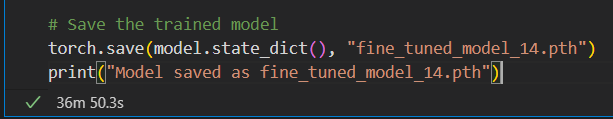

In [91]:
from transformers import RobertaTokenizer, RobertaForSequenceClassification

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
tokenizer = RobertaTokenizer.from_pretrained("roberta-base")
model_2 = RobertaForSequenceClassification.from_pretrained("roberta-base", num_labels=3)
model_2 = model_2.to(device)

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [92]:
# Import necessary libraries
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score
from bert_score import score as bert_score  # optional, for semantic similarity
from torch.utils.data import DataLoader, Dataset
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from sklearn.model_selection import train_test_split
import pandas as pd
from sklearn.metrics import cohen_kappa_score, matthews_corrcoef

# Define device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('Using', device)

# Load your dataset (replace this with your actual data loading logic)
# Example: If you have a CSV file for train and test
#train_df = pd.read_csv("D:/sentimentdataset/train.csv", encoding=result['encoding'])
# test_df = pd.read_csv("D:/sentimentdataset/test.csv", encoding=result['encoding'])

# Define a custom Dataset class
class SentimentDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=128):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(
            text,
            max_length=self.max_len,
            padding="max_length",
            truncation=True,
            return_tensors="pt",
        )
        return {
            "input_ids": encoding["input_ids"].squeeze(0),
            "attention_mask": encoding["attention_mask"].squeeze(0),
            "label": torch.tensor(label, dtype=torch.long),
        }
# Define the correct label mapping
'''#label_mapping = {
    "negative": 0,
    "neutral": 1,
    "positive": 2
}'''

#train_df['sentiment'] = train_df['sentiment'].map(label_mapping)
#test_df['sentiment'] = test_df['sentiment'].map(label_mapping)

# Drop rows with NaN values (if any)
#train_df = train_df.dropna(subset=['text'])
#test_df = test_df.dropna(subset=['text'])

# Verify the mapping
#print("Unique values after mapping (train):", train_df['sentiment'].unique())
#print("Unique values after mapping (test):", test_df['sentiment'].unique())
# Prepare datasets
train_texts = train_df['text'].tolist()  # Replace 'text_column' with the name of the text column
train_labels = train_df['sentiment'].tolist()  # Replace 'label_column' with the name of the label column

test_texts = test_df['text'].tolist()  # Replace 'text_column' with the name of the text column
test_labels = test_df['sentiment'].tolist()  # Replace 'label_column' with the name of the label column

train_dataset = SentimentDataset(train_texts, train_labels, tokenizer)
test_dataset = SentimentDataset(test_texts, test_labels, tokenizer)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(test_dataset, batch_size=16)

from transformers import get_scheduler
epochs = 3


# Define optimizer, loss function, and scheduler
optimizer = optim.AdamW(model_2.parameters(), lr=2e-5)
criterion = nn.CrossEntropyLoss()
# scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

import time 

# Training loop
num_training_steps = epochs * len(train_loader)
scheduler = get_scheduler(
    "linear", optimizer=optimizer, num_warmup_steps=0, num_training_steps=num_training_steps
)
for epoch in range(epochs):
    start_time = time.time()  # Start the timer for the epoch
    
    model_2.train()
    total_loss = 0
    train_correct = 0
    train_total = 0
    all_train_true_labels = []
    all_train_predicted_labels = []

    for batch in train_loader:
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        labels = batch["label"].to(device)

        optimizer.zero_grad()
        outputs = model_2(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()
        scheduler.step()


        # Compute training accuracy
        predictions = torch.argmax(outputs.logits, dim=-1)
        train_correct += (predictions == labels).sum().item()
        train_total += labels.size(0)

        all_train_true_labels.extend(labels.cpu().numpy())
        all_train_predicted_labels.extend(predictions.cpu().numpy())

        total_loss += loss.item()

    train_accuracy = train_correct / train_total
    print(f"Epoch {epoch + 1}, Loss: {total_loss / len(train_loader)}, Training Accuracy: {train_accuracy:.2f}")

    # Print classification report for training data
    print("Training Classification Report:")
    print(classification_report(all_train_true_labels, all_train_predicted_labels, target_names=["negative", "neutral", "positive"]))

    # Validation loop
    model_2.eval()
    val_correct = 0
    val_total = 0
    all_val_true_labels = []
    all_val_predicted_labels = []

    with torch.no_grad():
        for batch in val_loader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["label"].to(device)

            outputs = model_2(input_ids, attention_mask=attention_mask)
            predictions = torch.argmax(outputs.logits, dim=-1)
            val_correct += (predictions == labels).sum().item()
            val_total += labels.size(0)

            all_val_true_labels.extend(labels.cpu().numpy())
            all_val_predicted_labels.extend(predictions.cpu().numpy())

    val_accuracy = val_correct / val_total
    print(f"Validation Accuracy: {val_accuracy:.2f}")

    # Print classification report for validation data
    print("Validation Classification Report:")
    print(classification_report(all_val_true_labels, all_val_predicted_labels, target_names=["negative", "neutral", "positive"]))
    # After validation loop
    # If you kept the original texts (you must store them as well)
    pred_sentences = [test_texts[i] for i in range(len(test_texts)) if all_val_predicted_labels[i] == all_val_true_labels[i]]
    true_sentences = [test_texts[i] for i in range(len(test_texts)) if all_val_predicted_labels[i] == all_val_true_labels[i]]

    y_true = all_val_true_labels
    y_pred = all_val_predicted_labels

    print(f"Macro F1: {f1_score(all_val_true_labels, all_val_predicted_labels, average='macro'):.4f}")
    print(f"Weighted F1: {f1_score(all_val_true_labels, all_val_predicted_labels, average='weighted'):.4f}")
    print(f"Precision: {precision_score(all_val_true_labels, all_val_predicted_labels, average='weighted'):.4f}")
    print(f"Recall: {recall_score(all_val_true_labels, all_val_predicted_labels, average='weighted'):.4f}")

    # Cohen's Kappa
    kappa = cohen_kappa_score(y_true, y_pred)
    print(f"Cohen's Kappa: {kappa:.4f}")

    # Matthews Correlation Coefficient
    mcc = matthews_corrcoef(y_true, y_pred)
    print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

     # End the timer for the epoch
    end_time = time.time()
    epoch_duration = end_time - start_time
    print(f"Epoch {epoch + 1} completed in {epoch_duration:.2f} seconds.\n")


# Save the trained model
torch.save(model_2.state_dict(), "fine_tuned_model_15.pth")
print("Model saved as fine_tuned_model_15.pth")

Using cuda
Epoch 1, Loss: 0.40737050091943255, Training Accuracy: 0.83
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.83      0.81      0.82     36644
     neutral       0.81      0.84      0.83     39876
    positive       0.85      0.84      0.85     38967

    accuracy                           0.83    115487
   macro avg       0.83      0.83      0.83    115487
weighted avg       0.83      0.83      0.83    115487

Validation Accuracy: 0.85
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.92      0.79      0.85      9004
     neutral       0.73      0.82      0.78      5572
    positive       0.86      0.91      0.88      9570

    accuracy                           0.85     24146
   macro avg       0.84      0.84      0.84     24146
weighted avg       0.85      0.85      0.85     24146

Macro F1: 0.8366
Weighted F1: 0.8464
Precision: 0.8525
Recall: 0.8458
Cohen

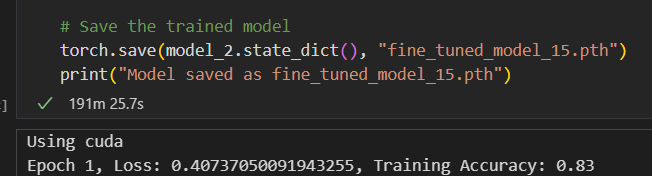

In [93]:
from transformers import AlbertTokenizer, AlbertForSequenceClassification
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
tokenizer = AlbertTokenizer.from_pretrained("albert-base-v2")
model_3 = AlbertForSequenceClassification.from_pretrained("albert-base-v2", num_labels=3)
model_3 = model_3.to(device)

Some weights of AlbertForSequenceClassification were not initialized from the model checkpoint at albert-base-v2 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [94]:
# Import necessary libraries
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score
from bert_score import score as bert_score  # optional, for semantic similarity
from torch.utils.data import DataLoader, Dataset
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from sklearn.model_selection import train_test_split
import pandas as pd
from sklearn.metrics import cohen_kappa_score, matthews_corrcoef

# Define device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('Using', device)

# Load your dataset (replace this with your actual data loading logic)
# Example: If you have a CSV file for train and test
#train_df = pd.read_csv("D:/sentimentdataset/train.csv", encoding=result['encoding'])
# test_df = pd.read_csv("D:/sentimentdataset/test.csv", encoding=result['encoding'])

# Define a custom Dataset class
class SentimentDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=128):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(
            text,
            max_length=self.max_len,
            padding="max_length",
            truncation=True,
            return_tensors="pt",
        )
        return {
            "input_ids": encoding["input_ids"].squeeze(0),
            "attention_mask": encoding["attention_mask"].squeeze(0),
            "label": torch.tensor(label, dtype=torch.long),
        }
# Define the correct label mapping
'''#label_mapping = {
    "negative": 0,
    "neutral": 1,
    "positive": 2
}'''

#train_df['sentiment'] = train_df['sentiment'].map(label_mapping)
#test_df['sentiment'] = test_df['sentiment'].map(label_mapping)

# Drop rows with NaN values (if any)
#train_df = train_df.dropna(subset=['text'])
#test_df = test_df.dropna(subset=['text'])

# Verify the mapping
#print("Unique values after mapping (train):", train_df['sentiment'].unique())
#print("Unique values after mapping (test):", test_df['sentiment'].unique())
# Prepare datasets
train_texts = train_df['text'].tolist()  # Replace 'text_column' with the name of the text column
train_labels = train_df['sentiment'].tolist()  # Replace 'label_column' with the name of the label column

test_texts = test_df['text'].tolist()  # Replace 'text_column' with the name of the text column
test_labels = test_df['sentiment'].tolist()  # Replace 'label_column' with the name of the label column

train_dataset = SentimentDataset(train_texts, train_labels, tokenizer)
test_dataset = SentimentDataset(test_texts, test_labels, tokenizer)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(test_dataset, batch_size=16)

from transformers import get_scheduler
epochs = 3


# Define optimizer, loss function, and scheduler
optimizer = optim.AdamW(model_3.parameters(), lr=2e-5)
criterion = nn.CrossEntropyLoss()
# scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

import time 

# Training loop
num_training_steps = epochs * len(train_loader)
scheduler = get_scheduler(
    "linear", optimizer=optimizer, num_warmup_steps=0, num_training_steps=num_training_steps
)
for epoch in range(epochs):
    start_time = time.time()  # Start the timer for the epoch
    
    model_3.train()
    total_loss = 0
    train_correct = 0
    train_total = 0
    all_train_true_labels = []
    all_train_predicted_labels = []

    for batch in train_loader:
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        labels = batch["label"].to(device)

        optimizer.zero_grad()
        outputs = model_3(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()
        scheduler.step()


        # Compute training accuracy
        predictions = torch.argmax(outputs.logits, dim=-1)
        train_correct += (predictions == labels).sum().item()
        train_total += labels.size(0)

        all_train_true_labels.extend(labels.cpu().numpy())
        all_train_predicted_labels.extend(predictions.cpu().numpy())

        total_loss += loss.item()

    train_accuracy = train_correct / train_total
    print(f"Epoch {epoch + 1}, Loss: {total_loss / len(train_loader)}, Training Accuracy: {train_accuracy:.2f}")

    # Print classification report for training data
    print("Training Classification Report:")
    print(classification_report(all_train_true_labels, all_train_predicted_labels, target_names=["negative", "neutral", "positive"]))

    # Validation loop
    model_3.eval()
    val_correct = 0
    val_total = 0
    all_val_true_labels = []
    all_val_predicted_labels = []

    with torch.no_grad():
        for batch in val_loader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["label"].to(device)

            outputs = model_3(input_ids, attention_mask=attention_mask)
            predictions = torch.argmax(outputs.logits, dim=-1)
            val_correct += (predictions == labels).sum().item()
            val_total += labels.size(0)

            all_val_true_labels.extend(labels.cpu().numpy())
            all_val_predicted_labels.extend(predictions.cpu().numpy())

    val_accuracy = val_correct / val_total
    print(f"Validation Accuracy: {val_accuracy:.2f}")

    # Print classification report for validation data
    print("Validation Classification Report:")
    print(classification_report(all_val_true_labels, all_val_predicted_labels, target_names=["negative", "neutral", "positive"]))
    # After validation loop
    # If you kept the original texts (you must store them as well)
    pred_sentences = [test_texts[i] for i in range(len(test_texts)) if all_val_predicted_labels[i] == all_val_true_labels[i]]
    true_sentences = [test_texts[i] for i in range(len(test_texts)) if all_val_predicted_labels[i] == all_val_true_labels[i]]

    y_true = all_val_true_labels
    y_pred = all_val_predicted_labels

    print(f"Macro F1: {f1_score(all_val_true_labels, all_val_predicted_labels, average='macro'):.4f}")
    print(f"Weighted F1: {f1_score(all_val_true_labels, all_val_predicted_labels, average='weighted'):.4f}")
    print(f"Precision: {precision_score(all_val_true_labels, all_val_predicted_labels, average='weighted'):.4f}")
    print(f"Recall: {recall_score(all_val_true_labels, all_val_predicted_labels, average='weighted'):.4f}")

    # Cohen's Kappa
    kappa = cohen_kappa_score(y_true, y_pred)
    print(f"Cohen's Kappa: {kappa:.4f}")

    # Matthews Correlation Coefficient
    mcc = matthews_corrcoef(y_true, y_pred)
    print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

     # End the timer for the epoch
    end_time = time.time()
    epoch_duration = end_time - start_time
    print(f"Epoch {epoch + 1} completed in {epoch_duration:.2f} seconds.\n")


# Save the trained model
torch.save(model_3.state_dict(), "fine_tuned_model_16.pth")
print("Model saved as fine_tuned_model_16.pth")

Using cuda
Epoch 1, Loss: 0.4401234045529768, Training Accuracy: 0.82
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.82      0.79      0.80     36644
     neutral       0.81      0.84      0.82     39876
    positive       0.83      0.82      0.83     38967

    accuracy                           0.82    115487
   macro avg       0.82      0.82      0.82    115487
weighted avg       0.82      0.82      0.82    115487

Validation Accuracy: 0.83
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.83      0.85      0.84      9004
     neutral       0.73      0.78      0.75      5572
    positive       0.88      0.82      0.85      9570

    accuracy                           0.83     24146
   macro avg       0.81      0.82      0.82     24146
weighted avg       0.83      0.83      0.83     24146

Macro F1: 0.8163
Weighted F1: 0.8260
Precision: 0.8281
Recall: 0.8251
Cohen'

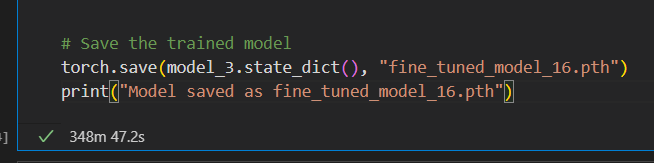

In [101]:
from transformers import BertTokenizer, BertForSequenceClassification
import torch

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load TinyBERT tokenizer and model
tokenizer = BertTokenizer.from_pretrained("prajjwal1/bert-tiny")
model_4 = BertForSequenceClassification.from_pretrained("prajjwal1/bert-tiny", num_labels=3)

# Move model to device
model_4 = model_4.to(device)


vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

d:\Anacondork\envs\CPE313-Dejoras\Lib\site-packages\huggingface_hub\file_download.py:144: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\Dylan James Dejoras\.cache\huggingface\hub\models--prajjwal1--bert-tiny. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


config.json:   0%|          | 0.00/285 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/17.8M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at prajjwal1/bert-tiny and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


model.safetensors:   0%|          | 0.00/17.7M [00:00<?, ?B/s]

In [102]:
# Import necessary libraries
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score
from bert_score import score as bert_score  # optional, for semantic similarity
from torch.utils.data import DataLoader, Dataset
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from sklearn.model_selection import train_test_split
import pandas as pd
from sklearn.metrics import cohen_kappa_score, matthews_corrcoef

# Define device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('Using', device)

# Load your dataset (replace this with your actual data loading logic)
# Example: If you have a CSV file for train and test
#train_df = pd.read_csv("D:/sentimentdataset/train.csv", encoding=result['encoding'])
# test_df = pd.read_csv("D:/sentimentdataset/test.csv", encoding=result['encoding'])

# Define a custom Dataset class
class SentimentDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=128):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(
            text,
            max_length=self.max_len,
            padding="max_length",
            truncation=True,
            return_tensors="pt",
        )
        return {
            "input_ids": encoding["input_ids"].squeeze(0),
            "attention_mask": encoding["attention_mask"].squeeze(0),
            "label": torch.tensor(label, dtype=torch.long),
        }
# Define the correct label mapping
'''#label_mapping = {
    "negative": 0,
    "neutral": 1,
    "positive": 2
}'''

#train_df['sentiment'] = train_df['sentiment'].map(label_mapping)
#test_df['sentiment'] = test_df['sentiment'].map(label_mapping)

# Drop rows with NaN values (if any)
#train_df = train_df.dropna(subset=['text'])
#test_df = test_df.dropna(subset=['text'])

# Verify the mapping
#print("Unique values after mapping (train):", train_df['sentiment'].unique())
#print("Unique values after mapping (test):", test_df['sentiment'].unique())
# Prepare datasets
train_texts = train_df['text'].tolist()  # Replace 'text_column' with the name of the text column
train_labels = train_df['sentiment'].tolist()  # Replace 'label_column' with the name of the label column

test_texts = test_df['text'].tolist()  # Replace 'text_column' with the name of the text column
test_labels = test_df['sentiment'].tolist()  # Replace 'label_column' with the name of the label column

train_dataset = SentimentDataset(train_texts, train_labels, tokenizer)
test_dataset = SentimentDataset(test_texts, test_labels, tokenizer)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(test_dataset, batch_size=16)

from transformers import get_scheduler
epochs = 3


# Define optimizer, loss function, and scheduler
optimizer = optim.AdamW(model_4.parameters(), lr=2e-5)
criterion = nn.CrossEntropyLoss()
# scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

import time 

# Training loop
num_training_steps = epochs * len(train_loader)
scheduler = get_scheduler(
    "linear", optimizer=optimizer, num_warmup_steps=0, num_training_steps=num_training_steps
)
for epoch in range(epochs):
    start_time = time.time()  # Start the timer for the epoch
    
    model_4.train()
    total_loss = 0
    train_correct = 0
    train_total = 0
    all_train_true_labels = []
    all_train_predicted_labels = []

    for batch in train_loader:
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        labels = batch["label"].to(device)

        optimizer.zero_grad()
        outputs = model_4(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()
        scheduler.step()


        # Compute training accuracy
        predictions = torch.argmax(outputs.logits, dim=-1)
        train_correct += (predictions == labels).sum().item()
        train_total += labels.size(0)

        all_train_true_labels.extend(labels.cpu().numpy())
        all_train_predicted_labels.extend(predictions.cpu().numpy())

        total_loss += loss.item()

    train_accuracy = train_correct / train_total
    print(f"Epoch {epoch + 1}, Loss: {total_loss / len(train_loader)}, Training Accuracy: {train_accuracy:.2f}")

    # Print classification report for training data
    print("Training Classification Report:")
    print(classification_report(all_train_true_labels, all_train_predicted_labels, target_names=["negative", "neutral", "positive"]))

    # Validation loop
    model_4.eval()
    val_correct = 0
    val_total = 0
    all_val_true_labels = []
    all_val_predicted_labels = []

    with torch.no_grad():
        for batch in val_loader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["label"].to(device)

            outputs = model_4(input_ids, attention_mask=attention_mask)
            predictions = torch.argmax(outputs.logits, dim=-1)
            val_correct += (predictions == labels).sum().item()
            val_total += labels.size(0)

            all_val_true_labels.extend(labels.cpu().numpy())
            all_val_predicted_labels.extend(predictions.cpu().numpy())

    val_accuracy = val_correct / val_total
    print(f"Validation Accuracy: {val_accuracy:.2f}")

    # Print classification report for validation data
    print("Validation Classification Report:")
    print(classification_report(all_val_true_labels, all_val_predicted_labels, target_names=["negative", "neutral", "positive"]))
    # After validation loop
    # If you kept the original texts (you must store them as well)
    pred_sentences = [test_texts[i] for i in range(len(test_texts)) if all_val_predicted_labels[i] == all_val_true_labels[i]]
    true_sentences = [test_texts[i] for i in range(len(test_texts)) if all_val_predicted_labels[i] == all_val_true_labels[i]]

    y_true = all_val_true_labels
    y_pred = all_val_predicted_labels

    print(f"Macro F1: {f1_score(all_val_true_labels, all_val_predicted_labels, average='macro'):.4f}")
    print(f"Weighted F1: {f1_score(all_val_true_labels, all_val_predicted_labels, average='weighted'):.4f}")
    print(f"Precision: {precision_score(all_val_true_labels, all_val_predicted_labels, average='weighted'):.4f}")
    print(f"Recall: {recall_score(all_val_true_labels, all_val_predicted_labels, average='weighted'):.4f}")

    # Cohen's Kappa
    kappa = cohen_kappa_score(y_true, y_pred)
    print(f"Cohen's Kappa: {kappa:.4f}")

    # Matthews Correlation Coefficient
    mcc = matthews_corrcoef(y_true, y_pred)
    print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

     # End the timer for the epoch
    end_time = time.time()
    epoch_duration = end_time - start_time
    print(f"Epoch {epoch + 1} completed in {epoch_duration:.2f} seconds.\n")


# Save the trained model
torch.save(model_4.state_dict(), "fine_tuned_model_17.pth")
print("Model saved as fine_tuned_model_17.pth")

Using cuda
Epoch 1, Loss: 0.6850010608662261, Training Accuracy: 0.69
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.69      0.60      0.64     36644
     neutral       0.68      0.80      0.74     39876
    positive       0.70      0.67      0.69     38967

    accuracy                           0.69    115487
   macro avg       0.69      0.69      0.69    115487
weighted avg       0.69      0.69      0.69    115487

Validation Accuracy: 0.73
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.73      0.76      0.75      9004
     neutral       0.62      0.71      0.66      5572
    positive       0.81      0.71      0.76      9570

    accuracy                           0.73     24146
   macro avg       0.72      0.73      0.72     24146
weighted avg       0.74      0.73      0.73     24146

Macro F1: 0.7226
Weighted F1: 0.7316
Precision: 0.7374
Recall: 0.7301
Cohen'

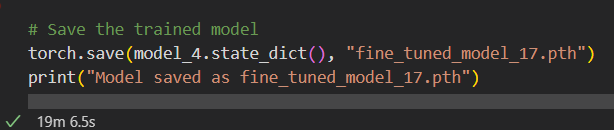

In [103]:
from transformers import DistilBertForSequenceClassification, AutoTokenizer

# Load a base model and tokenizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
tokenizer = AutoTokenizer.from_pretrained('distilbert-base-uncased')
model_5 = DistilBertForSequenceClassification.from_pretrained('distilbert-base-uncased', num_labels=3)
model_5 = model_5.to(device)

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [104]:
# Import necessary libraries
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score
from bert_score import score as bert_score  # optional, for semantic similarity
from torch.utils.data import DataLoader, Dataset
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from sklearn.model_selection import train_test_split
import pandas as pd
from sklearn.metrics import cohen_kappa_score, matthews_corrcoef

# Define device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('Using', device)

# Load your dataset (replace this with your actual data loading logic)
# Example: If you have a CSV file for train and test
#train_df = pd.read_csv("D:/sentimentdataset/train.csv", encoding=result['encoding'])
# test_df = pd.read_csv("D:/sentimentdataset/test.csv", encoding=result['encoding'])

# Define a custom Dataset class
class SentimentDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=128):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(
            text,
            max_length=self.max_len,
            padding="max_length",
            truncation=True,
            return_tensors="pt",
        )
        return {
            "input_ids": encoding["input_ids"].squeeze(0),
            "attention_mask": encoding["attention_mask"].squeeze(0),
            "label": torch.tensor(label, dtype=torch.long),
        }
# Define the correct label mapping
'''#label_mapping = {
    "negative": 0,
    "neutral": 1,
    "positive": 2
}'''

#train_df['sentiment'] = train_df['sentiment'].map(label_mapping)
#test_df['sentiment'] = test_df['sentiment'].map(label_mapping)

# Drop rows with NaN values (if any)
#train_df = train_df.dropna(subset=['text'])
#test_df = test_df.dropna(subset=['text'])

# Verify the mapping
#print("Unique values after mapping (train):", train_df['sentiment'].unique())
#print("Unique values after mapping (test):", test_df['sentiment'].unique())
# Prepare datasets
train_texts = train_df['text'].tolist()  # Replace 'text_column' with the name of the text column
train_labels = train_df['sentiment'].tolist()  # Replace 'label_column' with the name of the label column

test_texts = test_df['text'].tolist()  # Replace 'text_column' with the name of the text column
test_labels = test_df['sentiment'].tolist()  # Replace 'label_column' with the name of the label column

train_dataset = SentimentDataset(train_texts, train_labels, tokenizer)
test_dataset = SentimentDataset(test_texts, test_labels, tokenizer)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(test_dataset, batch_size=16)

from transformers import get_scheduler
epochs = 3


# Define optimizer, loss function, and scheduler
optimizer = optim.AdamW(model_5.parameters(), lr=2e-5)
criterion = nn.CrossEntropyLoss()
# scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

import time 

# Training loop
num_training_steps = epochs * len(train_loader)
scheduler = get_scheduler(
    "linear", optimizer=optimizer, num_warmup_steps=0, num_training_steps=num_training_steps
)
for epoch in range(epochs):
    start_time = time.time()  # Start the timer for the epoch
    
    model_5.train()
    total_loss = 0
    train_correct = 0
    train_total = 0
    all_train_true_labels = []
    all_train_predicted_labels = []

    for batch in train_loader:
        input_ids = batch["input_ids"].to(device)
        attention_mask = batch["attention_mask"].to(device)
        labels = batch["label"].to(device)

        optimizer.zero_grad()
        outputs = model_5(input_ids, attention_mask=attention_mask, labels=labels)
        loss = outputs.loss
        loss.backward()
        optimizer.step()
        scheduler.step()


        # Compute training accuracy
        predictions = torch.argmax(outputs.logits, dim=-1)
        train_correct += (predictions == labels).sum().item()
        train_total += labels.size(0)

        all_train_true_labels.extend(labels.cpu().numpy())
        all_train_predicted_labels.extend(predictions.cpu().numpy())

        total_loss += loss.item()

    train_accuracy = train_correct / train_total
    print(f"Epoch {epoch + 1}, Loss: {total_loss / len(train_loader)}, Training Accuracy: {train_accuracy:.2f}")

    # Print classification report for training data
    print("Training Classification Report:")
    print(classification_report(all_train_true_labels, all_train_predicted_labels, target_names=["negative", "neutral", "positive"]))

    # Validation loop
    model_5.eval()
    val_correct = 0
    val_total = 0
    all_val_true_labels = []
    all_val_predicted_labels = []

    with torch.no_grad():
        for batch in val_loader:
            input_ids = batch["input_ids"].to(device)
            attention_mask = batch["attention_mask"].to(device)
            labels = batch["label"].to(device)

            outputs = model_5(input_ids, attention_mask=attention_mask)
            predictions = torch.argmax(outputs.logits, dim=-1)
            val_correct += (predictions == labels).sum().item()
            val_total += labels.size(0)

            all_val_true_labels.extend(labels.cpu().numpy())
            all_val_predicted_labels.extend(predictions.cpu().numpy())

    val_accuracy = val_correct / val_total
    print(f"Validation Accuracy: {val_accuracy:.2f}")

    # Print classification report for validation data
    print("Validation Classification Report:")
    print(classification_report(all_val_true_labels, all_val_predicted_labels, target_names=["negative", "neutral", "positive"]))
    # After validation loop
    # If you kept the original texts (you must store them as well)
    pred_sentences = [test_texts[i] for i in range(len(test_texts)) if all_val_predicted_labels[i] == all_val_true_labels[i]]
    true_sentences = [test_texts[i] for i in range(len(test_texts)) if all_val_predicted_labels[i] == all_val_true_labels[i]]

    y_true = all_val_true_labels
    y_pred = all_val_predicted_labels

    print(f"Macro F1: {f1_score(all_val_true_labels, all_val_predicted_labels, average='macro'):.4f}")
    print(f"Weighted F1: {f1_score(all_val_true_labels, all_val_predicted_labels, average='weighted'):.4f}")
    print(f"Precision: {precision_score(all_val_true_labels, all_val_predicted_labels, average='weighted'):.4f}")
    print(f"Recall: {recall_score(all_val_true_labels, all_val_predicted_labels, average='weighted'):.4f}")

    # Cohen's Kappa
    kappa = cohen_kappa_score(y_true, y_pred)
    print(f"Cohen's Kappa: {kappa:.4f}")

    # Matthews Correlation Coefficient
    mcc = matthews_corrcoef(y_true, y_pred)
    print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

     # End the timer for the epoch
    end_time = time.time()
    epoch_duration = end_time - start_time
    print(f"Epoch {epoch + 1} completed in {epoch_duration:.2f} seconds.\n")


# Save the trained model
torch.save(model_5.state_dict(), "fine_tuned_model_18.pth")
print("Model saved as fine_tuned_model_18.pth")

Using cuda
Epoch 1, Loss: 0.4243376670081667, Training Accuracy: 0.82
Training Classification Report:
              precision    recall  f1-score   support

    negative       0.81      0.80      0.81     36644
     neutral       0.82      0.84      0.83     39876
    positive       0.84      0.82      0.83     38967

    accuracy                           0.82    115487
   macro avg       0.82      0.82      0.82    115487
weighted avg       0.82      0.82      0.82    115487

Validation Accuracy: 0.84
Validation Classification Report:
              precision    recall  f1-score   support

    negative       0.89      0.80      0.84      9004
     neutral       0.73      0.84      0.78      5572
    positive       0.86      0.87      0.87      9570

    accuracy                           0.84     24146
   macro avg       0.83      0.84      0.83     24146
weighted avg       0.84      0.84      0.84     24146

Macro F1: 0.8303
Weighted F1: 0.8380
Precision: 0.8426
Recall: 0.8371
Cohen'

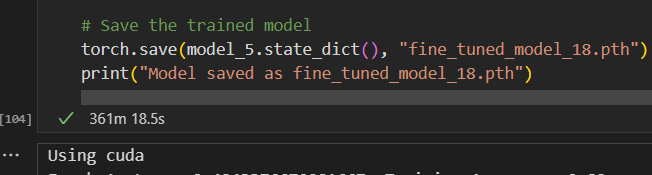

In [95]:
train_df.value_counts()

text                                                                                                        sentiment
    i have been getting **** ones as i mentioned - all these girls seem to be at a loss what to do!         0            2
    hope all is ok.                                                                                         2            2
    from g`s to gents season 1                                                                              1            2
    I like fridays generally, but class is extended today  and I`m starving :X haha </whine> O:-P           1            2
    You guys can make it through!                                                                           1            2
                                                                                                                        ..
    Mc  John  sim posit  3 yr passed  no  softees   stranded without warren tea out  tech spec  kaching !!  1            1
    Lmao Yes its on t

In [99]:
train_df.count

<bound method DataFrame.count of                                                      text  sentiment
0                     I`d have responded, if I were going          1
1           Sooo SAD I will miss you here in San Diego!!!          0
2                               my boss is bullying me...          0
3                          what interview! leave me alone          0
4        Sons of ****, why couldn`t they put them on t...          0
...                                                   ...        ...
115483  As a big Jim Carey fan I took my seat in the c...          0
115484  Kevin Spacey again picks a winner with K-PAX, ...          2
115485  I remember watching this in the 1970s - then I...          2
115486  at the story. It is reality mixed with America...          2
115487  I really think this movie deserves some Oscars...          2

[115487 rows x 2 columns]>

In [98]:
test_df.count

<bound method DataFrame.count of                                                     text  sentiment
0      Last session of the day  http://twitpic.com/67ezh          1
1       Shanghai is also really exciting (precisely -...          2
2      Recession hit Veronique Branquinho, she has to...          0
3                                            happy bday!          2
4                 http://twitpic.com/4w75p - I like it!!          2
...                                                  ...        ...
24141  I say 'I'd figure' in that line because, frank...          0
24142  This is arguably the worst film I have ever se...          0
24143  CONTAINS SPOILERS!<br /><br />I saw an advert ...          2
24144  This movie, supposedly a thriller, had about f...          0
24145  I thought this was a beautiful movie- very bra...          2

[24146 rows x 2 columns]>

In [28]:
print(model)
for name, param in model.named_parameters():
    print(name)

AlbertForSequenceClassification(
  (albert): AlbertModel(
    (embeddings): AlbertEmbeddings(
      (word_embeddings): Embedding(30000, 128, padding_idx=0)
      (position_embeddings): Embedding(512, 128)
      (token_type_embeddings): Embedding(2, 128)
      (LayerNorm): LayerNorm((128,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0, inplace=False)
    )
    (encoder): AlbertTransformer(
      (embedding_hidden_mapping_in): Linear(in_features=128, out_features=768, bias=True)
      (albert_layer_groups): ModuleList(
        (0): AlbertLayerGroup(
          (albert_layers): ModuleList(
            (0): AlbertLayer(
              (full_layer_layer_norm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
              (attention): AlbertSdpaAttention(
                (query): Linear(in_features=768, out_features=768, bias=True)
                (key): Linear(in_features=768, out_features=768, bias=True)
                (value): Linear(in_features=768, out_features=

In [4]:
import pandas as pd
import torch
from transformers import AutoTokenizer

# Load the tokenizer and fine-tuned model
tokenizer = AutoTokenizer.from_pretrained('distilbert-base-uncased')

# Define the model architecture
model = DistilBertForSequenceClassification.from_pretrained('distilbert-base-uncased', num_labels=3)

# Load the state dictionary into the model
state_dict = torch.load("D:/Anacondork/Activities/fine_tuned_model.pth")
model.load_state_dict(state_dict)

model.eval()  # Set the model to evaluation mode

# Define device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Load the CSV file containing the recordings' transcriptions
recordings_df = pd.read_csv("output.csv")  # Replace with your CSV file path

# Assign a column name to the text data
recordings_df.columns = ['text']

# Ensure the column with text is named 'text' (or adjust accordingly)
texts = recordings_df['text'].tolist()

# Define a function to predict sentiment
def predict_sentiment(text):
    # Tokenize the input text
    encoding = tokenizer(
        text,
        max_length=128,
        padding="max_length",
        truncation=True,
        return_tensors="pt"
    )
    input_ids = encoding["input_ids"].to(device)
    attention_mask = encoding["attention_mask"].to(device)

    # Run the model and get predictions
    with torch.no_grad():
        outputs = model(input_ids, attention_mask=attention_mask)
        predictions = torch.argmax(outputs.logits, dim=-1).item()

    # Map predictions back to sentiment labels
    label_mapping = {0: "negative", 1: "neutral", 2: "positive"}
    return label_mapping[predictions]

# Apply the prediction function to the DataFrame
recordings_df['predicted_sentiment'] = recordings_df['text'].apply(predict_sentiment)

# Save the results to a new CSV file
recordings_df.to_csv("recordings_with_sentiments.csv", index=False)

# Print the DataFrame with predictions
print(recordings_df)

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


                text predicted_sentiment
0       good morning            positive
1         i hate you            negative
2        i am hungry             neutral
3    how old are you             neutral
4  how are you today             neutral
5     stop stop stop             neutral
6     happy birthday            positive


In [9]:
import os

# Delete the file
os.remove("output.csv")

# Recreate an empty file
open("output.csv", "w").close()

print("CSV file cleared.")

CSV file cleared.


In [12]:
import os

# Delete the file
os.remove("recordings_with_sentiments.csv")

# Recreate an empty file
open("recordings_with_sentiments.csv", "w").close()

print("CSV file cleared.")

CSV file cleared.


In [23]:
train_df = train_df.dropna(subset=['text'])
test_df = test_df.dropna(subset=['text'])

In [26]:
print(test_df['sentiment'].unique())

[1 2 0]


In [25]:
print(train_df['sentiment'].unique())

[1 0 2]


In [31]:
train_df.tail()

,text,sentiment
31227,Grrrr....I got the wrong size coat for the sheep,0
31228,4 cases of swine flu!,1
31229,excellent,2
31230,is sitting thru the boring bits in Titanic wai...,1
31231,Missed the play,0


In [30]:
test_df.tail()

,text,sentiment
10406,Not sure what happened but now I have to hit t...,1
10407,"Pretty good app, lets you organize tasks by ca...",2
10408,This app is a piece of sh**. It won't sync my ...,0
10409,": Very interested. However, low carbs for the ...",2
10410,"Good app, but not exactly what I was looking f...",2


In [40]:
print(test_df['sentiment'].unique())

[1 2 0]


In [41]:
train_df

,text,sentiment
0,"I`d have responded, if I were going",1
1,Sooo SAD I will miss you here in San Diego!!!,0
2,my boss is bullying me...,0
3,what interview! leave me alone,0
4,"Sons of ****, why couldn`t they put them on t...",0
...,...,...
31227,Grrrr....I got the wrong size coat for the sheep,0
31228,4 cases of swine flu!,1
31229,excellent,2
31230,is sitting thru the boring bits in Titanic wai...,1


In [35]:
print(train_df['sentiment'].unique())  # Replace 'label_column' with the actual column name

[1 0 2]


In [81]:
train_df

,textID,text,selected_text,sentiment,Time of Tweet,Age of User,Country,Population -2020,Land Area (Km²),Density (P/Km²)
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,morning,0-20,Afghanistan,38928346,652860.0,60
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,noon,21-30,Albania,2877797,27400.0,105
2,088c60f138,my boss is bullying me...,bullying me,negative,night,31-45,Algeria,43851044,2381740.0,18
3,9642c003ef,what interview! leave me alone,leave me alone,negative,morning,46-60,Andorra,77265,470.0,164
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,noon,60-70,Angola,32866272,1246700.0,26
...,...,...,...,...,...,...,...,...,...,...
27476,4eac33d1c0,wish we could come see u on Denver husband l...,d lost,negative,night,31-45,Ghana,31072940,227540.0,137
27477,4f4c4fc327,I`ve wondered about rake to. The client has ...,", don`t force",negative,morning,46-60,Greece,10423054,128900.0,81
27478,f67aae2310,Yay good for both of you. Enjoy the break - y...,Yay good for both of you.,positive,noon,60-70,Grenada,112523,340.0,331
27479,ed167662a5,But it was worth it ****.,But it was worth it ****.,positive,night,70-100,Guatemala,17915568,107160.0,167


In [51]:
train_df.duplicated().sum()

np.int64(20447)

In [33]:
# Find all duplicate rows, including the first occurrence
duplicate_rows = train_df[train_df.duplicated(keep=False)]

# Display duplicate rows
print(duplicate_rows)

                                                    text  sentiment
0                    I`d have responded, if I were going          1
2                              my boss is bullying me...          0
3                         what interview! leave me alone          0
5      http://www.dothebouncy.com/smf - some shameles...          1
8                                            Both of you          1
...                                                  ...        ...
31226                of course it is   http://is.gd/kqSK          1
31227   Grrrr....I got the wrong size coat for the sheep          0
31228                              4 cases of swine flu!          1
31230  is sitting thru the boring bits in Titanic wai...          1
31231                                    Missed the play          0

[40894 rows x 2 columns]


In [34]:
# Find all duplicate rows, including the first occurrence
duplicate_rows = train_df[train_df.duplicated(keep=False)]

# Display the exact rows and their indices
for index, row in duplicate_rows.iterrows():
    print(f"Duplicate row at index {index}:\n{row}\n")

Duplicate row at index 0:
text          I`d have responded, if I were going
sentiment                                       1
Name: 0, dtype: object

Duplicate row at index 2:
text         my boss is bullying me...
sentiment                            0
Name: 2, dtype: object

Duplicate row at index 3:
text          what interview! leave me alone
sentiment                                  0
Name: 3, dtype: object

Duplicate row at index 5:
text         http://www.dothebouncy.com/smf - some shameles...
sentiment                                                    1
Name: 5, dtype: object

Duplicate row at index 8:
text          Both of you
sentiment               1
Name: 8, dtype: object

Duplicate row at index 9:
text          Journey!? Wow... u just became cooler.  hehe....
sentiment                                                    2
Name: 9, dtype: object

Duplicate row at index 10:
text          as much as i love to be hopeful, i reckon the...
sentiment                             

In [35]:
# Find all duplicate rows, including the first occurrence
duplicate_rows = train_df[train_df.duplicated(keep=False)]

# Group duplicate rows by their content and display their indices
grouped_duplicates = duplicate_rows.groupby(list(duplicate_rows.columns)).apply(lambda x: list(x.index))

# Display the partnered duplicates
for content, indices in grouped_duplicates.items():
    print(f"Duplicate rows with content:\n{content}\nExist at indices: {indices}\n")

Duplicate rows with content:
('      get lit  I am  http://bit.ly/OASQR', 1)
Exist at indices: [16717, 18348]

Duplicate rows with content:
('     Good morning to you !  Its so pretty outside today', 2)
Exist at indices: [11861, 9039]

Duplicate rows with content:
('     I LOVE YOU GUYS! get your **** to australia in december for my birthday', 2)
Exist at indices: [12977, 27423]

Duplicate rows with content:
('     Soooooooo What Happened To Power ForReal?', 1)
Exist at indices: [25732, 5655]

Duplicate rows with content:
('     my bracelet broke today too.', 0)
Exist at indices: [26830, 4172]

Duplicate rows with content:
('    #followfriday thank you so much. I`m so behind. Still at about half of what I had.', 2)
Exist at indices: [22588, 27103]

Duplicate rows with content:
('    - Overwhelming lead for Strawberry Lemonade!!  My husband voted for Banana Fosters tho.', 2)
Exist at indices: [6230, 4664]

Duplicate rows with content:
('    Go get `em!  lol', 1)
Exist at indices: [4870,

C:\Users\Dylan James Dejoras\AppData\Local\Temp\ipykernel_808\1009296764.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped_duplicates = duplicate_rows.groupby(list(duplicate_rows.columns)).apply(lambda x: list(x.index))


In [44]:
train_df.head(26633)

,text,sentiment
0,"I`d have responded, if I were going",1
1,Sooo SAD I will miss you here in San Diego!!!,0
2,my boss is bullying me...,0
3,what interview! leave me alone,0
4,"Sons of ****, why couldn`t they put them on t...",0
...,...,...
26629,_eyes I wish I knew! The curse of Tumblr.,2
26630,thinks that the limit of 140 letters is really...,0
26631,"Lol. Thanks, Penny. I`m trying to believe you.",2
26632,p.s. sorry about ur uncle,0


In [45]:
# Find all duplicate rows, including the first occurrence
duplicate_rows = train_df[train_df.duplicated(keep=False)]

# Display the columns where duplicates are detected
for content, indices in duplicate_rows.groupby(list(duplicate_rows.columns)).apply(lambda x: list(x.index)).items():
    print(f"Duplicate rows with content:\n{content}\nExist at indices: {indices}\n")

# Check if duplicates are caused by specific columns (e.g., 'sentiment')
duplicate_sentiment = train_df[train_df.duplicated(subset=['sentiment'], keep=False)]
print(duplicate_sentiment)

Duplicate rows with content:
('      get lit  I am  http://bit.ly/OASQR', 1)
Exist at indices: [16717, 18348]

Duplicate rows with content:
('     Good morning to you !  Its so pretty outside today', 2)
Exist at indices: [11861, 9039]

Duplicate rows with content:
('     I LOVE YOU GUYS! get your **** to australia in december for my birthday', 2)
Exist at indices: [12977, 27423]

Duplicate rows with content:
('     Soooooooo What Happened To Power ForReal?', 1)
Exist at indices: [25732, 5655]

Duplicate rows with content:
('     my bracelet broke today too.', 0)
Exist at indices: [26830, 4172]

Duplicate rows with content:
('    #followfriday thank you so much. I`m so behind. Still at about half of what I had.', 2)
Exist at indices: [22588, 27103]

Duplicate rows with content:
('    - Overwhelming lead for Strawberry Lemonade!!  My husband voted for Banana Fosters tho.', 2)
Exist at indices: [6230, 4664]

Duplicate rows with content:
('    Go get `em!  lol', 1)
Exist at indices: [4870,

C:\Users\Dylan James Dejoras\AppData\Local\Temp\ipykernel_808\1680827432.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  for content, indices in duplicate_rows.groupby(list(duplicate_rows.columns)).apply(lambda x: list(x.index)).items():


In [47]:
train_df.head(18348)

,text,sentiment
0,"I`d have responded, if I were going",1
1,Sooo SAD I will miss you here in San Diego!!!,0
2,my boss is bullying me...,0
3,what interview! leave me alone,0
4,"Sons of ****, why couldn`t they put them on t...",0
...,...,...
18344,lapit na ko magout. lapit na fated to love you...,1
18345,_go you sure ?,1
18346,sike sike call it truce???????????????? u sti...,0
18347,http://goingtorain.com/ - about as precise as ...,2


In [ ]:
import speech_recognition as sr
import pyttsx3
import csv
from pydub import AudioSegment
import os
from datetime import datetime

r = sr.Recognizer()

output_folder = "recordings"
os.makedirs(output_folder, exist_ok=True)

def record_text():
    while True:
        try:
            with sr.Microphone() as source:
                r.adjust_for_ambient_noise(source, duration=0.2)
                print("Listening... (say 'stop' to exit)")
                audio = r.listen(source)

                # Generate a unique filename using a timestamp
                timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
                wav_filename = os.path.join(output_folder, f"recording_{timestamp}.wav")
                mp3_filename = os.path.join(output_folder, f"recording_{timestamp}.mp3")

                # Save the audio as a WAV file
                with open(wav_filename, "wb") as f:
                    f.write(audio.get_wav_data())

                # Convert WAV to MP3
                sound = AudioSegment.from_wav(wav_filename)
                sound.export(mp3_filename, format="mp3")
                os.remove(wav_filename)  # Remove the temporary WAV file

                MyText = r.recognize_google(audio, language="en-US")
                return MyText
        except sr.RequestError as e:
            print("Could not request results; {0}".format(e))
        except sr.UnknownValueError:
            print("Could not understand audio")
    return

def output_text_to_file(text):
    # Save text to a plain text file
    with open("output.txt", "a") as f:
        f.write(text + "\n")

    # Save text to a CSV file
    with open("output.csv", "a", newline="") as csvfile:
        csvwriter = csv.writer(csvfile)
        csvwriter.writerow([text])

    return

while True:
    text = record_text()
    if text.lower() == "stop":  # Check if the user said "stop"
        print("Stopping the program...")
        break
    output_text_to_file(text)
    print("Wrote text and saved recording")